In [54]:
%pylab inline
import os
import detect3D
import astropy.io.fits as pyfits
from astropy.table import Table
from configparser import ConfigParser

try:
    import ipyvolume as ipv
except ImportError:
    pass
def gaussian(x, mu, sig):
    return 1./np.sqrt(2.*np.pi)/sig*np.exp(-np.power(x - mu, 2.) / (2 * np.power(sig, 2.)))

import haloSim
from pixel3D import cartesianGrid3D
from sparseBase import massmapSparsityTaskNew
if True:
    figMsDir='/work/xiangchong.li/work/massMapSparse/sim/plot/'
else:
    figMsDir='/home/xiangchong/.local/code/massMap_Private/doc/paper_ms_method_HSCY1/'

Populating the interactive namespace from numpy and matplotlib


In [2]:
cd wrkDir/sim/

/work/xiangchong.li/work/massMapSparse/sim


In [3]:
lnm='nl20'
configName  =   'planck-cosmo/config-pix96-%s.ini' %lnm
parser      =   ConfigParser()
parser.read(configName)
gridInfo    =   cartesianGrid3D(parser)

In [4]:
# Which halo to use
iz  =   2
im  =   7
isim=   52
hdir0='planck-cosmo/pix96-ns10/'
hdir=os.path.join(hdir0,'halo%d%d'%(iz,im))
odir='./' 

outfname0   =  os.path.join(hdir0,'pixsigma-%d%d.fits' %(iz,im))
outfname1   =  os.path.join(hdir,'pixShearR-g1-%d%d-sim%d.fits' %(iz,im,isim))
outfname2   =  os.path.join(hdir,'pixShearR-g2-%d%d-sim%d.fits' %(iz,im,isim))
outfname3   =  os.path.join(hdir0,'pixStd.fits')
assert os.path.isfile(outfname0)
assert os.path.isfile(outfname1)
assert os.path.isfile(outfname2)
assert os.path.isfile(outfname3)

In [5]:
outfname4   =  os.path.join(hdir0,'lensing_kernel_%s.fits' %lnm )
if not os.path.isfile(outfname4):
    print('preparing the lens kernel file')
    datDir='/work/xiangchong.li/work/S16ACatalogs/'
    tn='9347.fits'
    cfn='%s/S16AStandardCalibrated/tract/%s' %(datDir,tn)
    cdata=pyfits.getdata(cfn)
    poz_best=cdata['mlz_photoz_best']
    pfn='%s/S16AStandardCalibrated/tract/%s_pofz.fits' %(datDir,tn.split('.')[0])
    poz_data=pyfits.getdata(pfn)['PDF']
    bfn='%s/S16AStandardV2/field/pz_pdf_bins_mlz.fits' %datDir
    poz_bins=pyfits.getdata(bfn)['BINS']
    lensKernel= gridInfo.lensing_kernel(poz_grids=poz_bins,poz_data=poz_data,poz_best=poz_best)
    pyfits.writeto(outfname4,lensKernel,overwrite=True)
    for i in range(gridInfo.nzl):
        toPlt=lensKernel[:,i]
        norm=np.sqrt(np.sum(lensKernel[:,i]**2.))
        print(norm)

In [7]:
# configuration
parser.set('prepare','g1fname',outfname1)
parser.set('prepare','g2fname',outfname2)
parser.set('prepare','sigmafname',outfname3)
parser.set('prepare','lkfname',outfname4)

print(parser.get('transPlane','smooth_scale'))
print(parser.get('prepare','g2fname'))


# Reconstruction Init
tau=0.
lbd=5.
parser.set('sparse','lbd','%s' %lbd )
parser.set('sparse','aprox_method','fista' )
parser.set('sparse','nframe','2' )
parser.set('sparse','lcd','0' )
parser.set('sparse','mu','-1' )
parser.set('sparse','minframe','0' )
parser.set('sparse','tau','%s' %tau)
parser.set('sparse','debugList','[]')
sparse3D    =   massmapSparsityTaskNew(parser)

1.5
planck-cosmo/pix96-ns10/halo27/pixShearR-g2-27-sim52.fits


595003846197549.8
212786844941620.28
143772182251760.3
104917130068089.86
90375142107877.77
87102659660548.5
71579880978044.58
72461435202694.94


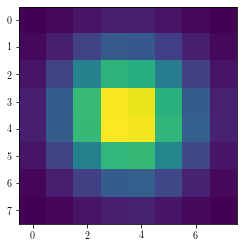

In [8]:
rshow=4
for i in range(8):
    sigmafname=   os.path.join(hdir0,'pixsigma-%d3.fits' %(i))
    Sigma=pyfits.getdata(sigmafname)
    toshow=Sigma[48-rshow:48+rshow,48-rshow:48+rshow]
    plt.imshow(toshow)
    print(np.abs(toshow).max())
    #print(np.average(toshow))

# sparse analysis

In [71]:
sparse3D.process(1200)

In [92]:
p=np.zeros(sparse3D.shapeA)
ss=sparse3D.alphaR*sparse3D._w

for izl in range(sparse3D.nlp):
    for ifr in range(sparse3D.nframe):
        if ifr==0:
            rsmth=0#int(4.2**(1.-izl/8.)+0.5)
        else:
            rsmth=0
        #print(rsmth)
        for jsh in range(-rsmth,rsmth+1):
            dif    =   np.roll(ss[izl,ifr],jsh,axis=-2)
            for ish in range(-rsmth,rsmth+1):
                dif2=   np.roll(dif,ish,axis=-1)
                p[izl,ifr] += dif2/(2.*rsmth+1.)#**2. snr

p=np.abs(p)

p=p/sparse3D._w/sparse3D.sigmaA

thres_adp=1./1e10
mask=(p>thres_adp)

w=np.zeros(sparse3D.shapeA)
w[mask]=1./(p[mask])**(2.)
w[~mask]=1./thres_adp
sparse3D.fista_gradient_descent(800,w=w)

In [ ]:
sparse3D.reconstruct()
ipv.figure()
vol1=ipv.volshow(sparse3D.deltaR,level=[0.85,0.35,0.01],opacity=[1.,0.3,0.005],extent=[[-sparse3D.ny//2,sparse3D.nx//2],[-sparse3D.ny//2,sparse3D.nx//2],[0.01,0.85]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

0.0
0.21387282363963217


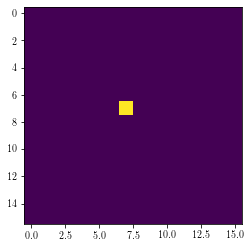

In [91]:
ishow=2
rshow=8
zl=gridInfo.zlcgrid[ishow]
rhoM_ave=gridInfo.cosmo.rho_m(zl)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[ishow],gridInfo.zlbound[ishow+1])
toshow=sparse3D.alphaR[ishow,1,48-rshow:48+rshow,48-rshow:48+rshow]#/sparse3D.mu#*ratio
plt.imshow(toshow)
print(toshow.min())
print(toshow.max())
#print(toshow)

In [ ]:
hn='17'
sn='52'
iz=eval(hn[0])
im=eval(hn[1])
zer='pz'
ner='wn' #wn/nn
fname='planck-cosmo/sparse-f1-1/halo%s/deltaR-sim%s-alasso2.fits' %(hn,sn)
data=pyfits.getdata(fname)
ipv.figure()

vol1=ipv.volshow(np.moveaxis(data,0,1),level=[0.95,0.70],opacity=[1.,0.3], \
    controls=False)
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.style.axes_off()
ipv.show()

figName1=os.path.join(figMsDir,'delta-%d-%d-%s-%s-PM-falsepeakproblem.png' %(iz,im,zer,ner))
ipv.pylab.savefig(figName1)

In [41]:
p.moveaxis(data,0,1).shape

(96, 20, 96)

0.0
-13.74889102296197


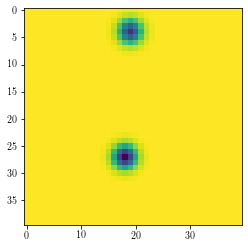

In [77]:
R=20
toshow=data[19,48-R:48+R,48-R:48+R]
imshow(toshow)
print(np.max(toshow))
print(np.min(toshow))

In [46]:
fname='toy-cosmo/sparse-f1/halo%s/deltaR-%s-sim%s-alasso2.fits' %(hn,hn,sn)
data=pyfits.getdata(fname)
ipv.figure()
vol1=ipv.volshow(data,level=[0.90,0.35,0.01],opacity=[1.,0.3,0.005],extent=[[-48,48],[-48,48],[0.01,0.86]])
ipv.view(150,15,2.8)
ipv.xlabel('ra')
ipv.ylabel('dec')
ipv.zlabel('z')
ipv.show()
#ipv.pylab.savefig('./after_adaptive_frame1_smooth.png')

0.15700000000000003
32.90921025735844
0.37425589913996427


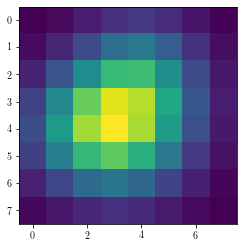

In [33]:
ishow=3
rshow=4
gridInfo    =   cartesianGrid3D(parser)
zl=gridInfo.zlcgrid[ishow]
rhoM_ave=gridInfo.cosmo.rho_m(zl)
DaBin=gridInfo.cosmo.Da(gridInfo.zlbound[ishow],gridInfo.zlbound[ishow+1])
ratio=(rhoM_ave*DaBin)
toshow=data[ishow,48-rshow:48+rshow,48-rshow:48+rshow]#*ratio
plt.imshow(toshow)
print(gridInfo.zlcgrid[ishow])
print(np.abs(toshow).max())
print(toshow.min())

In [67]:
nmp='f1-3'
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp,iz,im))
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.

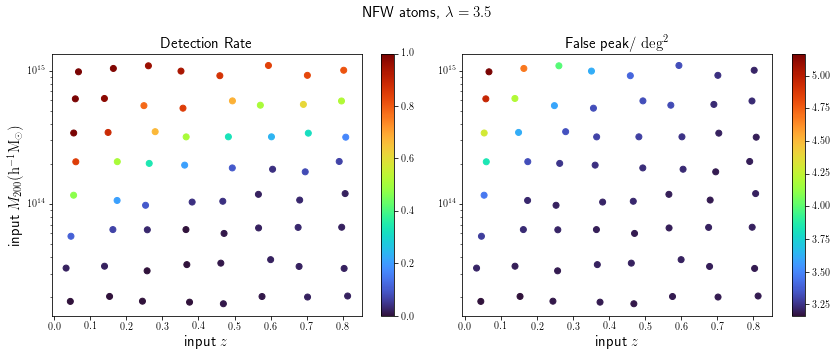

In [68]:
fig=plt.figure(figsize=(12,5))
fig.suptitle(r'NFW atoms, $\lambda=3.5$',fontsize=15)
ax=fig.add_subplot(1,2,1)
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='turbo')
plt.colorbar()
plt.title('Detection Rate',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

ax=fig.add_subplot(1,2,2)
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['falRat'],cmap='turbo')
plt.colorbar()
plt.title(r'False peak/ $\rm{deg}^2$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.yscale('log')
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'detfalseRate_%s.pdf' %nmp))

/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/numpy/lib/function_base.py:380: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis)
/work/xiangchong.li/lsstsw/miniconda/envs/lsst-scipipe/lib/python3.7/site-packages/numpy/core/_methods.py:170: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


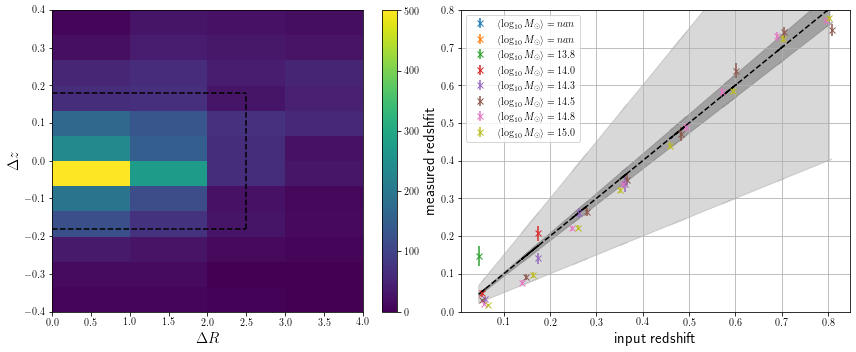

In [69]:
fig=plt.figure(figsize=(12,5))
ax=fig.add_subplot(1,2,1)
hist=np.zeros((4,12))
for i in range(8):
    for j in range(8):
        a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp,i,j))
        #a=a[a['value']>0.]
        dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
        dz=a['dZ']
        hist+=np.histogram2d(dr,dz,bins=(4,12),range=((0,4),(-0.4,0.4)),density=False)[0]
plt.imshow(hist.T,origin='lower',aspect='auto',extent=(0,4,-0.4,0.4))
plt.colorbar()
plt.plot(np.linspace(0,2.5,10),np.ones(10)*0.18,'--',c='black')
plt.plot(np.linspace(0,2.5,10),np.ones(10)*-0.18,'--',c='black')
plt.plot(np.ones(10)*2.5,np.linspace(-0.18,0.18,10),'--',c='black')
plt.xlabel(r'$\Delta R$',fontsize=15)
plt.ylabel(r'$\Delta z$',fontsize=15)


ax=fig.add_subplot(1,2,2)
cmap=plt.get_cmap('tab10')
catt=cat[cat['zMea']>0.]
plt.plot(catt['zh'],catt['zh'],'--',c='black')
for im in range(8):
    if im!=7:
        imm=im
    else:
        imm=im+1
    color=cmap(imm)
    cc=catt[catt['im']==im]
    plt.errorbar(cc['zh'],cc['zMea'],cc['zErr']/(np.sqrt(cc['detRat']*100)),fmt='x',c=color,label=r'$\langle \log_{10}M_{\odot} \rangle=%.1f$' %np.average(cc['log10_M200']))
p,cov=np.polyfit(catt['zh'].data,catt['zMea'].data,1,w=1./catt['zErr']*np.sqrt(catt['detRat']*100),cov=True)
erm=np.sqrt(cov[0,0]);erc=np.sqrt(cov[1,1])
#plt.plot(catt['zh'],np.polyval(p,catt['zh']),color='black',ls='-')


plt.fill_between(catt['zh'], 0.95*catt['zh'], 1.05*catt['zh'],color='gray',alpha=0.6)
plt.fill_between(catt['zh'], 0.5*catt['zh'], 1.5*catt['zh'],color='gray',alpha=0.3)
plt.legend(fontsize=10)
plt.tight_layout()
plt.xlabel(r'input redshift',fontsize=15)
plt.ylabel(r'measured redshfit',fontsize=15)
plt.ylim(0.,0.8)
plt.grid()
#plt.savefig(os.path.join(figMsDir,'peak_scatters_f3-1.pdf'))

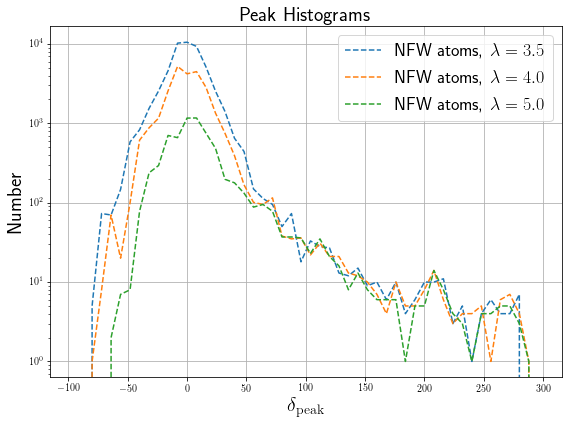

In [226]:
plt.figure(figsize=(8,6))
nmlist=['f3-1','f3-2','f3-3']
lblist=['nfw atoms, $\lambda=3.5$','nfw atoms, $\lambda=4.0$','nfw atoms, $\lambda=5.0$']

for inm,nmp2 in enumerate(nmlist):
    histP=np.zeros(50)
    for i in range(8):
        for j in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nmp2,i,j))
            histP+=np.histogram(a['value'],bins=50,range=(-100,300),density=False)[0]
    grids=np.histogram(a['value'],bins=50,range=(-100,300),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.plot(grids,histP,'--',label=r'%s'%lblist[inm])
    plt.yscale('log')
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

-0.0005342176142124451
0.11917532836311356
6.605
132.09999999905784


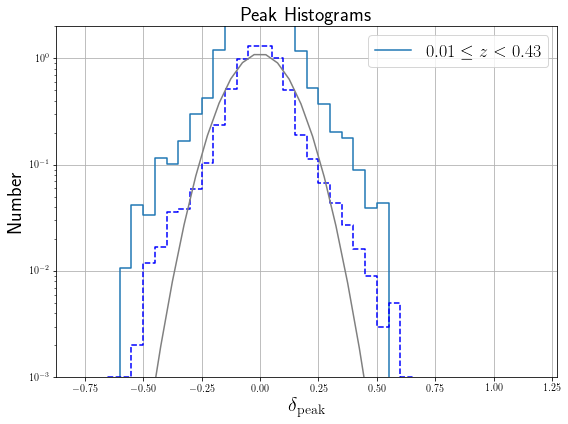

In [71]:
if False:
    weight=np.ones(20)
    minR=-100
    maxR=300
else:
    weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))
    minR=-0.8
    maxR=1.2
cmap=plt.get_cmap('tab10')
plt.figure(figsize=(8,6))
nm='f1-1'
lblist=['$0.01\leq z<0.43$','$0.43\leq z<0.85$']
nbins=40

for izz in range(0,1):
    zmin=izz*10;zmax=izz*10+20
    histP=np.zeros(nbins)
    n=0
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            mask=(a['iz']<zmax)&(a['iz']>=zmin)
            a=a[mask]
            histP+=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
            n+=1
    grids=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.step(grids,histP/n/100,'-',label=r'%s'%lblist[izz],c=cmap(izz),where='mid')

    a=pyfits.getdata('planck-cosmo/sparse-%s-2/src-%d%d-alasso2.fits' %(nm,800,800))
    mask=(a['iz']<zmax)&(a['iz']>=zmin)
    a=a[mask]
    histP=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
    plt.step(grids,histP/10/100,'--',c='blue',where='mid')
    ave=np.average(a['value']*weight[np.int_(a['iz'])])
    print(ave)
    std=np.std(a['value']*weight[np.int_(a['iz'])])
    print(std)
    amp=np.sum(histP)/1000.
    print(amp)
    gauFit=gaussian(grids,ave,std)*amp
    gauFit=gauFit/np.sum(gauFit)*amp
    plt.plot(grids,gauFit,c='gray')
    print(np.sum(gaussian(grids,ave,std)*amp))
    

plt.yscale('log')
plt.ylim(1e-3,2e-0)
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

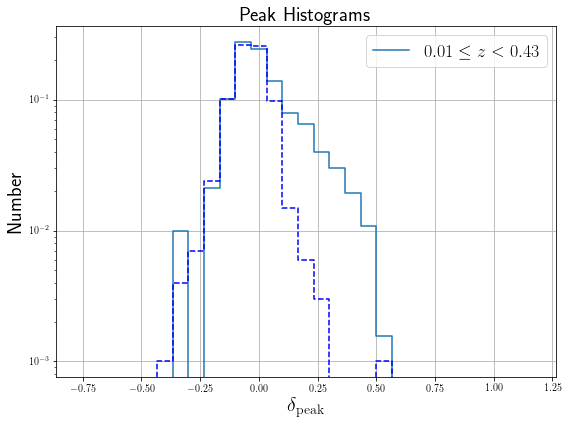

In [14]:
if False:
    weight=np.ones(20)
    minR=-100
    maxR=300
else:
    weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))
    minR=-0.8
    maxR=1.2
cmap=plt.get_cmap('tab10')
plt.figure(figsize=(8,6))
nm='f3-3'
lblist=['$0.01\leq z<0.43$','$0.43\leq z<0.85$']
nbins=30

for izz in range(0,1):
    zmin=izz*10;zmax=izz*10+20
    histP=np.zeros(nbins)
    n=0
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            mask=(a['iz']<zmax)&(a['iz']>=zmin)
            a=a[mask]
            histP+=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
            n+=1
    grids=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.step(grids,histP/n/100,'-',label=r'%s'%lblist[izz],c=cmap(izz))

    a=pyfits.getdata('planck-cosmo/sparse-%s-2/src-%d%d-alasso2.fits' %(nm,800,800))
    mask=(a['iz']<zmax)&(a['iz']>=zmin)
    a=a[mask]
    histP=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
    plt.step(grids,histP/10/100,'--',c='blue')

plt.yscale('log')
plt.ylim()
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

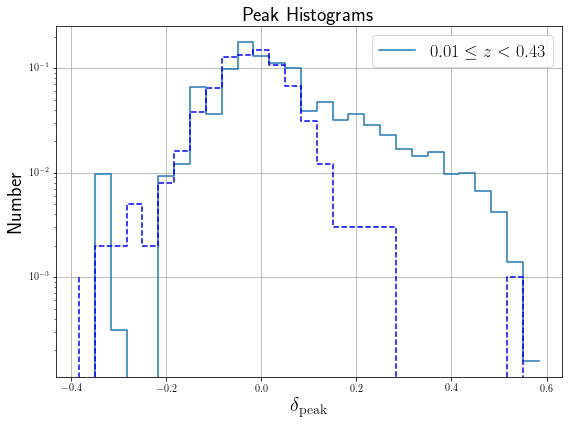

In [30]:
if False:
    weight=np.ones(len(weight))
    minR=-100
    maxR=300
else:
    weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))
    minR=-0.4
    maxR=0.6
cmap=plt.get_cmap('tab10')
plt.figure(figsize=(8,6))
nm='f3-3'
lblist=['$0.01\leq z<0.43$','$0.43\leq z<0.85$']
nbins=30

for izz in range(1):
    zmin=izz*10;zmax=izz*10+20
    histP=np.zeros(nbins)
    n=0
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            mask=(a['iz']<zmax)&(a['iz']>=zmin)
            a=a[mask]
            histP+=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
            n+=1
    grids=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[1]
    grids=(grids[1:]+grids[:-1])/2.
    plt.step(grids,histP/n/100,'-',label=r'%s'%lblist[izz],c=cmap(izz))

    a=pyfits.getdata('planck-cosmo/sparse-%s-2/src-%d%d-alasso2.fits' %(nm,800,800))
    mask=(a['iz']<zmax)&(a['iz']>=zmin)
    a=a[mask]
    histP=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)[0]
    plt.step(grids,histP/10/100,'--',c='blue')

plt.yscale('log')
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

No handles with labels found to put in legend.


-0.0012139853679517727 0.0011059492630758946
0.0918273201929306


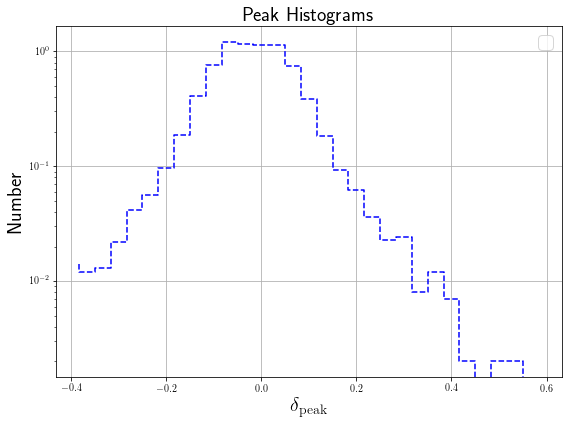

In [73]:
weight=np.sqrt(np.sum(gridInfo.lensing_kernel()**2.,axis=0))
minR=-0.4
maxR=0.6
cmap=plt.get_cmap('tab10')
plt.figure(figsize=(8,6))
nm='f3-1'
lblist=['$0.01\leq z<0.43$','$0.43\leq z<0.85$']
nbins=30

histP=np.zeros(nbins)
a=pyfits.getdata('planck-cosmo/sparse-%s-2/src-%d%d-alasso2.fits' %(nm,800,800))
histP,grids0=np.histogram(a['value']*weight[np.int_(a['iz'])],bins=nbins,range=(minR,maxR),density=False)
grids=(grids0[:-1]+grids0[1:])/2.
plt.step(grids,histP/10/100,'--',c='blue')
data  = a['value']*weight[np.int_(a['iz'])]
mean  = np.mean(data)
stddev= np.std(data)
print(mean,stddev/np.sqrt(len(data)))
data_c= np.clip(data,mean - 3* stddev,mean + 3* stddev)
stdcl=np.std(data_c)
print(stdcl)
plt.yscale('log')
plt.title('Peak Histograms',fontsize=20)
plt.legend(fontsize=18)
plt.grid()
plt.xlabel(r'$\delta_{\rm{peak}}$',fontsize=20)
plt.ylabel('Number',fontsize=20)
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'peak_histograms.pdf'))

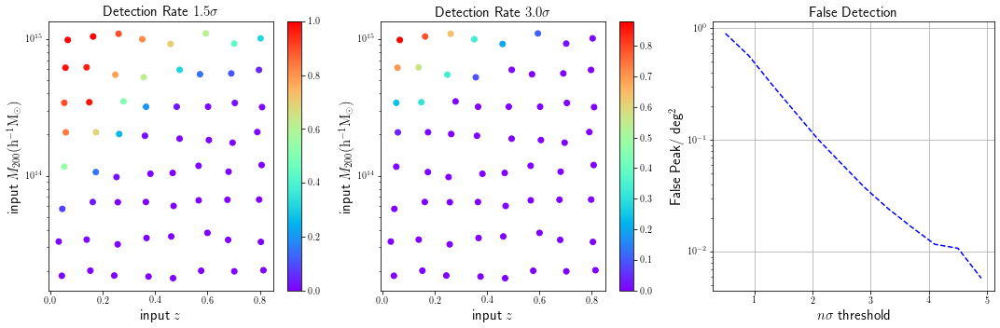

In [75]:
nm='f3-1'
cmap=plt.get_cmap('tab10')
fig=plt.figure(figsize=(15,5))

ax=fig.add_subplot(1,3,1)
mu=1.5
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
    a=a[(a['value']*weight[np.int_(a['iz'])]>stdcl*mu)]
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='rainbow')
plt.colorbar()
plt.title(r'Detection Rate $1.5\sigma$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

fig.add_subplot(1,3,2)
mu=3.0
cat=Table.read('planck-cosmo/nfw-halos/haloCat-202010032144.csv')
cat['detRat']=np.zeros(len(cat))
cat['falRat']=np.zeros(len(cat))
cat['zMea']=np.zeros(len(cat))
cat['zErr']=np.zeros(len(cat))
for ic in cat:
    iz=ic['iz']
    im=ic['im']
    a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
    a=a[(a['value']*weight[np.int_(a['iz'])]>stdcl*mu)]
    dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
    dz=np.abs(a['dZ'])
    mask=(dr<=2.5)&(dz<0.18)
    trueInd=np.unique(a[mask]['isim'],return_index=True)[1]
    nreal=len(trueInd)
    detDat=a[mask][trueInd]
    if nreal>10.:
        ic['zMea']=np.average(ic['zh']+detDat['dZ'])
        ic['zErr']=np.std(ic['zh']+detDat['dZ'])
    else:
        ic['zMea']=-1.
        ic['zErr']=-1.
    ic['detRat']=nreal/100.
    ic['falRat']=(len(a)-nreal)/100./96**2.*60**2.
plt.scatter(cat['zh'],10.**cat['log10_M200'],c=cat['detRat'],cmap='rainbow')
plt.colorbar()
plt.title(r'Detection Rate $3.0\sigma$',fontsize=15)
plt.xlabel(r'input $z$',fontsize=15)
plt.ylabel(r'input $M_{200} (\rm{h^{-1}M_{\odot}})$',fontsize=15)
plt.yscale('log')

fig.add_subplot(1,3,3)
thresList=np.arange(0.5,5.,0.4)
numCLList=[]
numNOList=[]
for thres in thresList:
    numCL=0
    numNO=0
    for iz in range(8):
        for im in range(8):
            a=pyfits.getdata('planck-cosmo/sparse-%s/src-%d%d-alasso2.fits' %(nm,iz,im))
            maskC=(a['value']*weight[np.int_(a['iz'])]>thres*0.0776)
            dr=np.sqrt(a['dRA']**2.+a['dDEC']**2.)
            dz=np.abs(a['dZ'])
            maskT=(dr<=2.5)&(dz<0.18)
            numCL+=np.sum(maskC&maskT)
            numNO+=np.sum(maskC&~maskT)/100./96**2.*60**2./64.
    numCLList.append(numCL)
    numNOList.append(numNO)
plt.plot(thresList,numNOList,ls='--',color='blue')
plt.yscale('log')
plt.title(r'False Detection',fontsize=15)
plt.xlabel(r'$n\sigma$ threshold',fontsize=15)
plt.ylabel('False Peak/ deg$^2$',fontsize=15)
plt.grid()
plt.tight_layout()
#plt.savefig(os.path.join(figMsDir,'detfalse_threshold.pdf'))

In [ ]:
'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r'

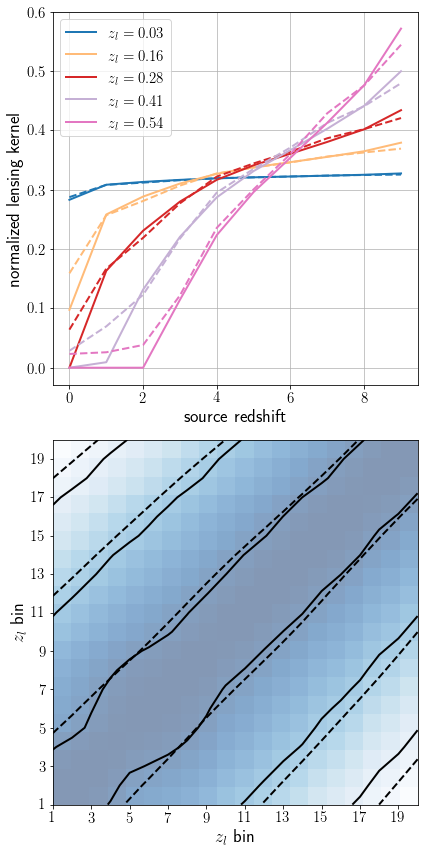

In [66]:
plt.close()
fig=plt.figure(figsize=(6,12))
cmap=plt.get_cmap('tab20') 
ax=fig.add_subplot(2,1,1)
#ax.set_title('lensing kernel')
lk1=gridInfo.lensing_kernel()
lk2=sparse3D.lensKernel
for izl in range(0,20):
    norm1=np.sqrt(np.sum(lk1[:,izl]**2.))
    norm2=np.sqrt(np.sum(lk2[:,izl]**2.))
    if izl<15 and izl%3==0.:
        ax.plot(lk1[:,izl]/norm1,'-',c=cmap(izl),label=r'$z_l=%.2f$' %gridInfo.zlcgrid[izl])
        ax.plot(lk2[:,izl]/norm2,'--',c=cmap(izl))
    lk1[:,izl]=lk1[:,izl]/norm1
    lk2[:,izl]=lk2[:,izl]/norm2
plt.grid()
ax.set_xlabel('source redshift')
ax.set_ylabel('normalized lensing kernel')
plt.legend(fontsize=15)


ax=fig.add_subplot(2,1,2)
#ax.set_title(r'correlation matrices')
im=np.array(np.matrix(lk1).T.dot(np.matrix(lk1)))
img=ax.imshow(im,origin='lower',vmin=0.6,vmax=1.,cmap='Blues',extent=(1,20,1,20),alpha=0.5)
ax.contour(im.T,extent=[1,20,1,20],colors='black',levels=[0.7, 0.85,0.98])
im=np.array(np.matrix(lk2).T.dot(np.matrix(lk2)))
plt.rcParams['contour.negative_linestyle'] = 'dashed'
ax.contour(-im.T,extent=[1,20,1,20],colors='black',levels=[-0.98,-0.85,-0.7])

ax.set_xticks(np.arange(1,21,2))
ax.set_yticks(np.arange(1,21,2))
ax.set_xlabel(r'$z_l$ bin')
ax.set_ylabel(r'$z_l$ bin')
#fig.colorbar(img,orientation='horizontal')
plt.tight_layout()
plt.savefig(os.path.join(figMsDir,'lensing_kernel.pdf'))

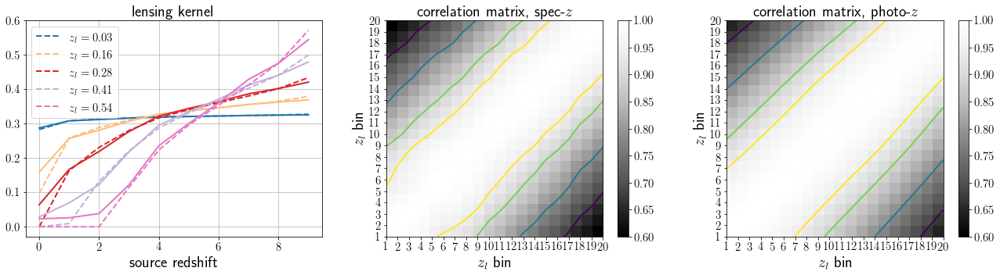

In [11]:
ax=fig.add_subplot(1,3,3)
ax.set_title(r'correlation matrix, photo-$z$', fontsize=20)
im=np.array(np.matrix(lk2).T.dot(np.matrix(lk2)))
ax.contour(im.T,extent=[1,20,1,20],cmap='viridis',levels=[0.7, 0.8, 0.9,0.95])
img=ax.imshow(im,origin='lower',vmin=0.6,vmax=1.,cmap='Greys_r',extent=(1,20,1,20))
plt.xticks(range(1,21))
plt.yticks(range(1,21))
ax.set_xlabel(r'$z_l$ bin',fontsize=20)
ax.set_ylabel(r'$z_l$ bin',fontsize=20)
plt.colorbar(img)
plt.tight_layout()

#plt.savefig(os.path.join(figMsDir,'lensing_kernel.pdf'))